# Results: Noise Texture Preservation

## Outline
- [Background](#Background:-Importance-of-Noise-Texture-in-Detectability)
- [Noise Texture Images](#Looking-at-Noise-Texture-Images)
- [1D NPS plots](#Noise-Power-Spectra-Plots)

## Background: Importance of Noise Texture in Detectability
Noise texture is an important aspect of CT image quality, while its evaluation is not a part of the [IEC Standard 61223-3-5 on CT performance evaluation](https://webstore.iec.ch/publication/59789) or [US regulations 1020.33 on CT](https://www.ecfr.gov/current/title-21/chapter-I/subchapter-J/part-1020/section-1020.33), it is routinely a part of clinical image quality evaluationas due to its strong influence on low contrast detectability as illustrated below. 

As introduced in [Noise Texture Characterizaton notebook](../01%20Method%20Developement/characterizing_noise_augmentation.ipynb) on comparing intensity histograms and NPS curves for noise. Below, two uniform water phantoms, of diameters 350 and 112 mm were images with reference noise quality values of 24 HU, such that both have the same noise mangitude measured in a central ROI. Despite having the same noise magnitude, the smaller 112 mm phantom has a visually lower low contrast detectability because the larger-sized grain noise is similar in size to the low contrast lesion and its standard deviation exceeds the contrast level of the lesions (3, 5, 10, 14 HU in order of the largest to smallest diameter lesion).

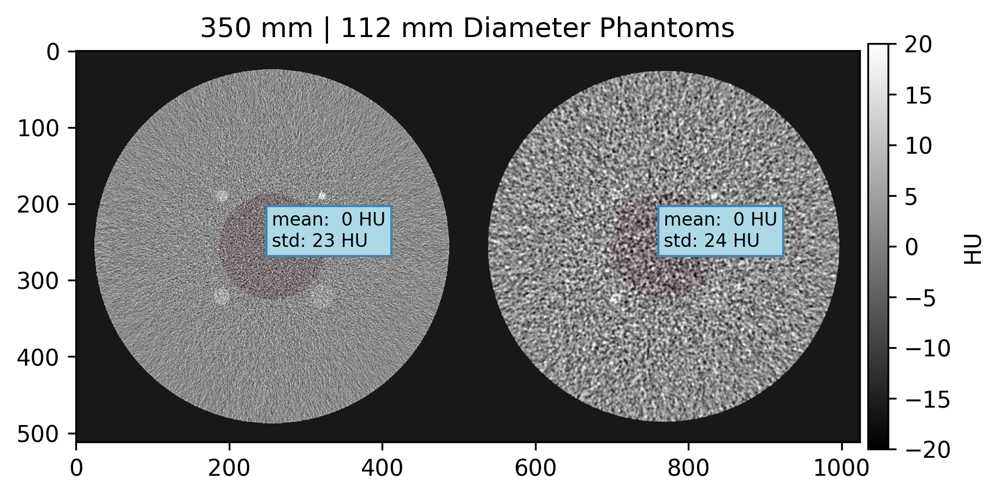

In [1]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np

import sys
sys.path.append('..')

from utils import circle_select, get_circle_diameter, load_mhd

base_dir = '/gpfs_projects/brandon.nelson/PediatricCTSizeDataAugmentation/CCT189_peds/'
n_images = 10
small_phantom = load_mhd(base_dir + 'diameter112mm/fbp/dose_100/signal_present/signal_present.mhd') - 1000
large_phantom = load_mhd(base_dir + 'diameter350mm/fbp/dose_100/signal_present/signal_present.mhd') - 1000

phantom_diameter_px = get_circle_diameter(small_phantom[0])
circle_selection_diameter_px = 0.3*phantom_diameter_px # iec standard suggests centred circle ROI 40% of phantom diameter 
circle_selection = circle_select(small_phantom[0], (256, 256), r = circle_selection_diameter_px/2)

plt.figure(dpi=300)
plt.imshow(np.concatenate([large_phantom[:n_images].mean(axis=0), small_phantom[:n_images].mean(axis=0)], axis=1), vmin=-20, vmax=20, cmap='gray')
plt.colorbar(fraction=0.025, pad=0.01, label='HU')
plt.imshow(np.concatenate([circle_selection, circle_selection], axis=1), vmin=0, vmax=1, alpha=0.1, cmap='Reds')
plt.annotate(f'mean: {large_phantom[0, circle_selection].mean():2.0f} HU\nstd: {large_phantom[0, circle_selection].std():2.0f} HU', (256, 256), fontsize=8, bbox=dict(boxstyle='square,pad=0.3', fc="lightblue", ec="steelblue"))
plt.annotate(f'mean: {small_phantom[0, circle_selection].mean():2.0f} HU\nstd: {small_phantom[0, circle_selection].std():2.0f} HU', (256+512, 256), fontsize=8, bbox=dict(boxstyle='square,pad=0.3', fc="lightblue", ec="steelblue"))
plt.grid(False)
plt.title('350 mm | 112 mm Diameter Phantoms')
plt.show()

**Objective: Noise Texture Evaluation**

This notebook evaluates the impact of the proposed noise-texture based data augmentation on the resulting image quality. As introduced in (**cite method development notebook**). Let's start by looking at the actual images of uniform water phantoms as a montage of increasing diameter and FOV size starting from smallest to largest, `112, 151, 216, 350` are put in by default but can be modified to be any diameter in `results_dict`

## Looking at Noise Texture Images

In [13]:
import sys
sys.path.append('../..')

from noise_assessments import load_data, plot_images, plot_noise_images, plot_nps_profiles

datadir = '/gpfs_projects/brandon.nelson/PediatricCTSizeDataAugmentation/CCT189_peds'
results_dir = '../../results/02-26-2024_19-52_redcnn_remove_random_noise_level'

In [3]:
results_dict, summary = load_data(datadir, results_dir)

In [12]:
results_dict.keys()

dict_keys([112, 131, 151, 185, 200, 216, 292, 350])

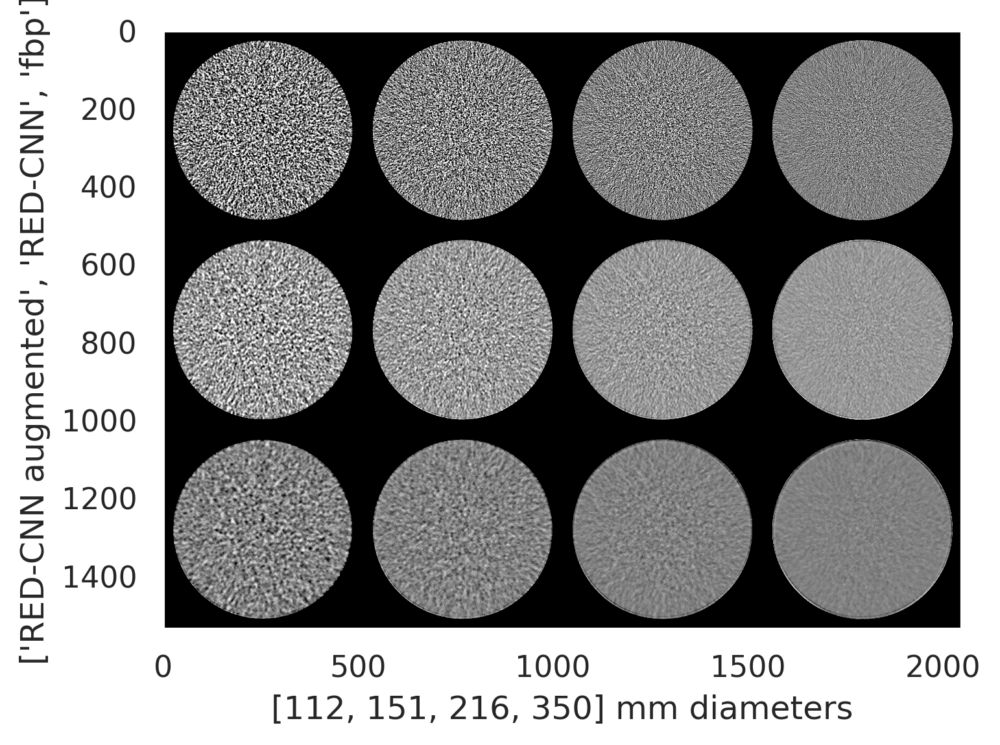

In [11]:
plot_images(results_dict, diameters=[112, 151, 216, 350])

And what is `results_dict`? It's a nested dictionary with the following structure:
`diameters` --> `dose levels [%]` --> `recons` --> `measures` accessed in the following way:

In [24]:
print('diameters: ', results_dict.keys())
print('dose levels [%]: ', results_dict[112].keys())
print('Recons: ', results_dict[112][100].keys())
print('Stored measurements: ', results_dict[112][100]['fbp'].keys())

diameters:  dict_keys([112, 131, 151, 185, 200, 216, 292, 350])
dose levels [%]:  dict_keys([100, 25])
Recons:  dict_keys(['RED-CNN augmented', 'RED-CNN', 'fbp'])
Stored measurements:  dict_keys(['image', 'noise image', 'nps', 'profile', 'std'])


`results_dict` is used as a convenient intermediate data storage, generated here (**cite me**) for plotting results in this notebook

PosixPath('../../results/02-26-2024_19-52_redcnn_remove_random_noise_level/noise_images.png')

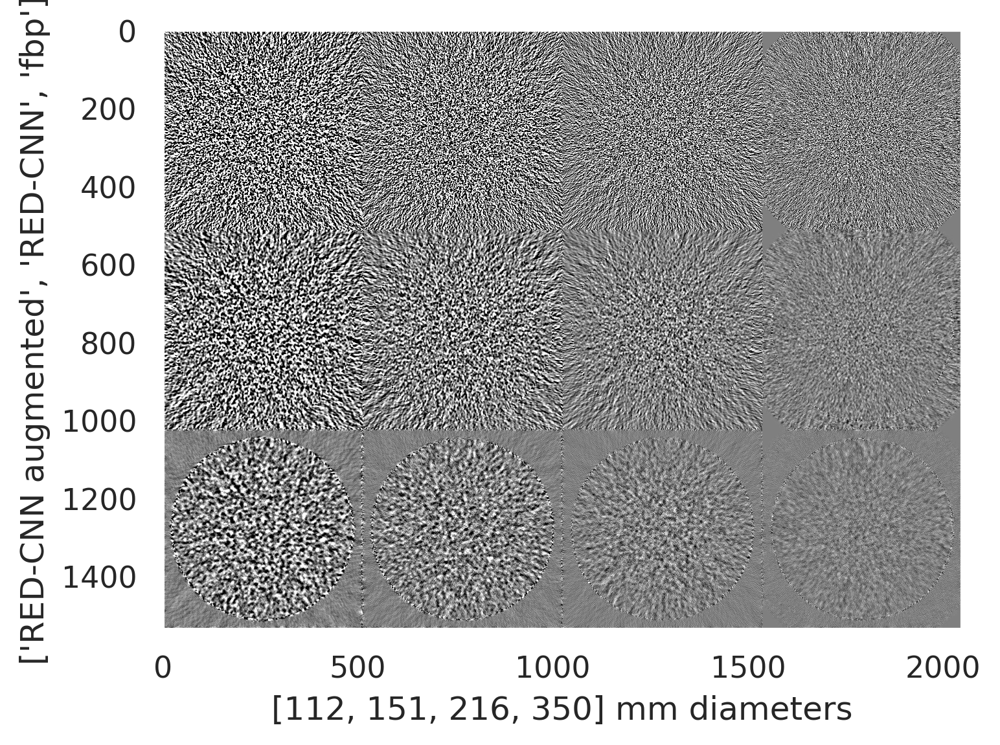

In [25]:
plot_noise_images(results_dict, results_dir, diameters=[112, 151, 216, 350])

Comparing both the original images and noise images, created by taking the difference of two independent scan simulations, we see the *noise texture* varies substantially between images (*note*: we've already discussed differences in noise magnitude based on differences in denoising efficiency here (**cite other results notebook on denoising efficiency**). We can quantify noise texture using Fourier analysis in the form of noise power spectra plots which quantify the spatial correlations of noise at different length scales. Noise power at lower

generating 1000 fbp noise images from the following phantom scans: ['diameter112mm', 'diameter131mm', 'diameter151mm', 'diameter185mm', 'diameter200mm', 'diameter216mm', 'diameter292mm', 'diameter350mm']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.14s/it]


saving to --> ../results/02-22-2024_13-14_redcnn_augmented_dc_bias_removed/noise_texture_fbp.png


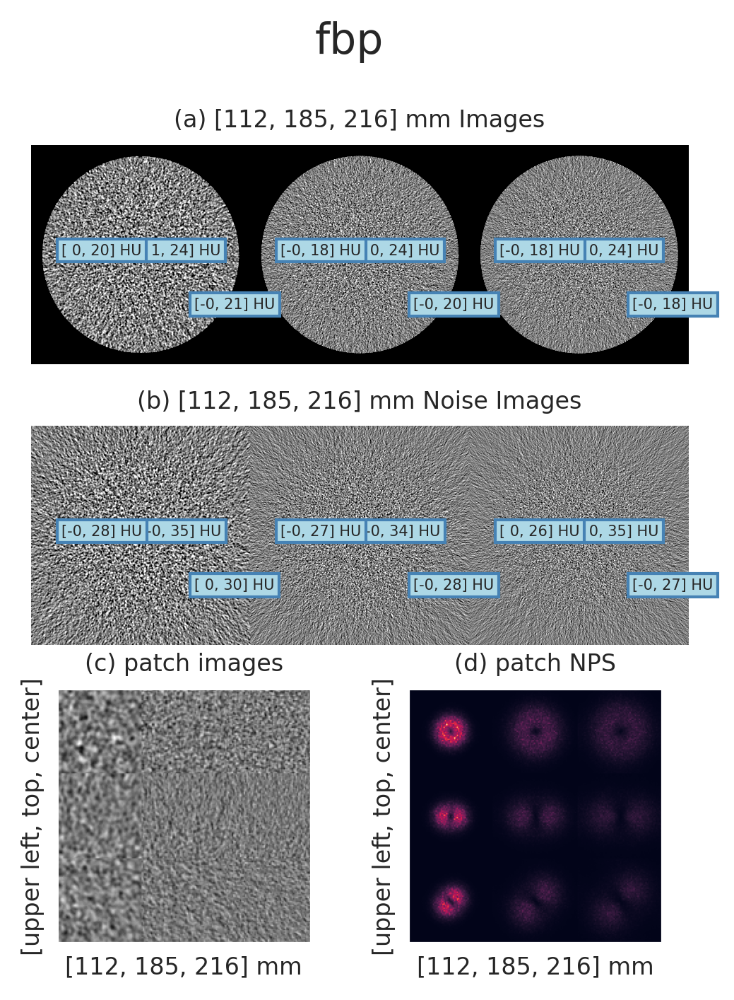

In [1]:
import sys
sys.path.append('..')
from methods_figures import characterize_noise_texture

datadir = '/gpfs_projects/brandon.nelson/PediatricCTSizeDataAugmentation/CCT189_peds'
results_dir = '../results/02-22-2024_13-14_redcnn_augmented_dc_bias_removed'
characterize_noise_texture(datadir, results_dir=results_dir, patch_size=64, kernel='fbp')

generating 1000 RED-CNN noise images from the following phantom scans: ['diameter112mm', 'diameter131mm', 'diameter151mm', 'diameter185mm', 'diameter200mm', 'diameter216mm', 'diameter292mm', 'diameter350mm']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:15<00:00,  1.89s/it]


saving to --> ../results/02-22-2024_13-14_redcnn_augmented_dc_bias_removed/noise_texture_RED-CNN.png


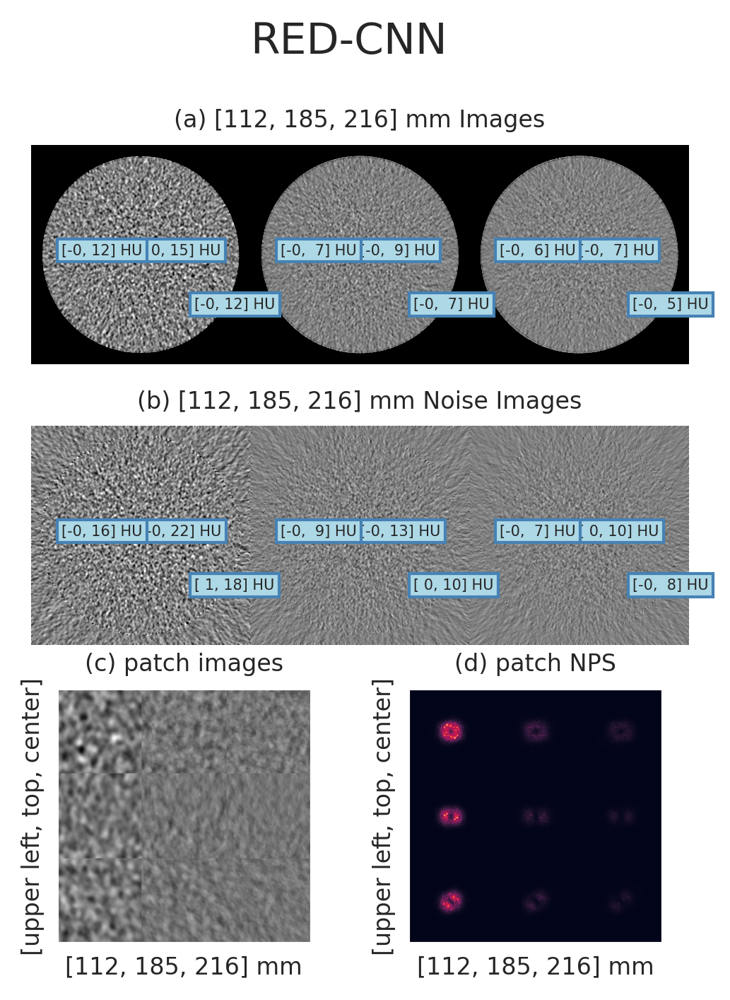

In [3]:
characterize_noise_texture(datadir, results_dir=results_dir, patch_size=64, kernel='RED-CNN')

generating 1000 fbp noise images from the following phantom scans: ['diameter112mm', 'diameter131mm', 'diameter151mm', 'diameter185mm', 'diameter200mm', 'diameter216mm', 'diameter292mm', 'diameter350mm']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 11.78it/s]


saving to --> ../results/02-22-2024_13-14_redcnn_augmented_dc_bias_removed/noise_texture_fbp.png
generating 1000 RED-CNN noise images from the following phantom scans: ['diameter112mm', 'diameter131mm', 'diameter151mm', 'diameter185mm', 'diameter200mm', 'diameter216mm', 'diameter292mm', 'diameter350mm']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:18<00:00,  2.35s/it]


saving to --> ../results/02-22-2024_13-14_redcnn_augmented_dc_bias_removed/noise_texture_RED-CNN.png
generating 1000 RED-CNN augmented noise images from the following phantom scans: ['diameter112mm', 'diameter131mm', 'diameter151mm', 'diameter185mm', 'diameter200mm', 'diameter216mm', 'diameter292mm', 'diameter350mm']


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:17<00:00,  2.16s/it]


saving to --> ../results/02-22-2024_13-14_redcnn_augmented_dc_bias_removed/noise_texture_RED-CNN augmented.png


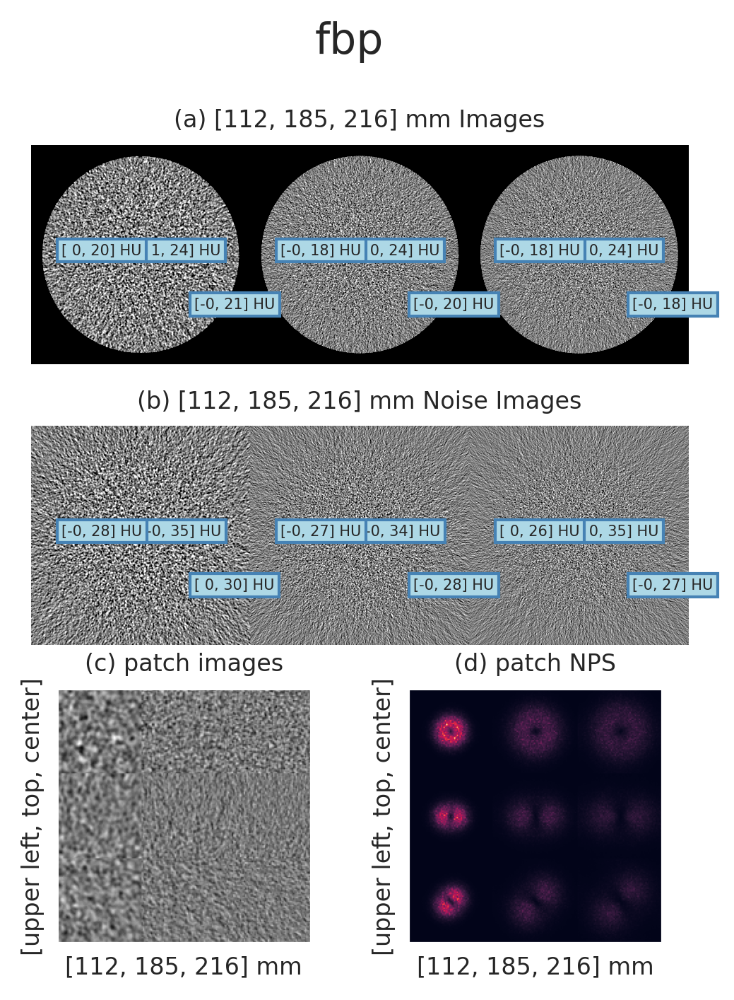

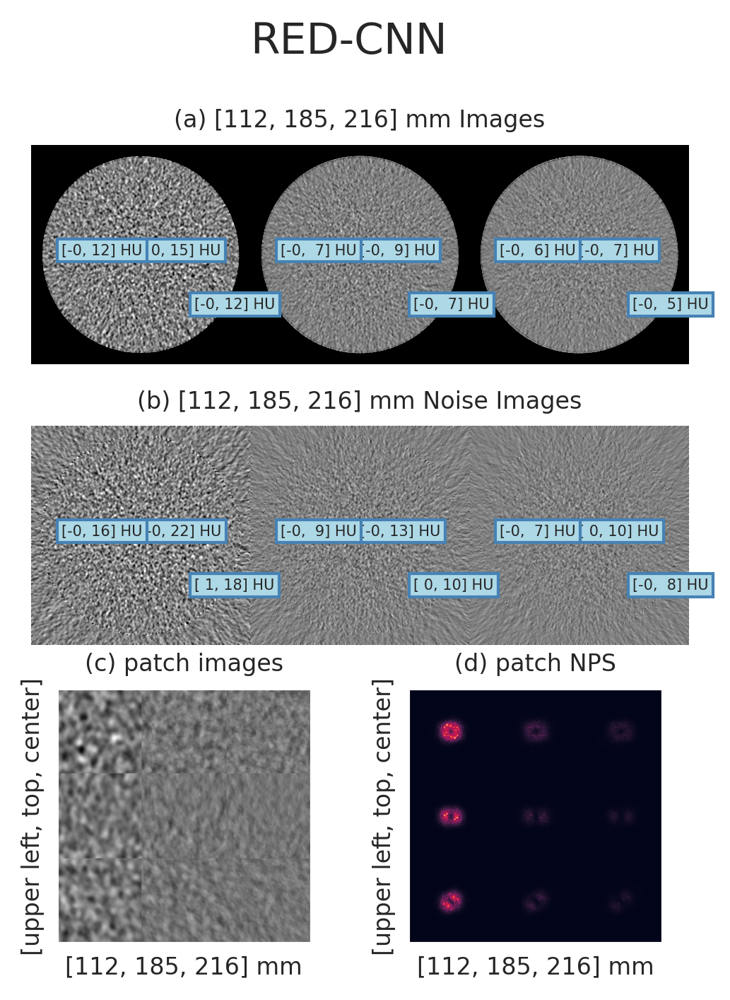

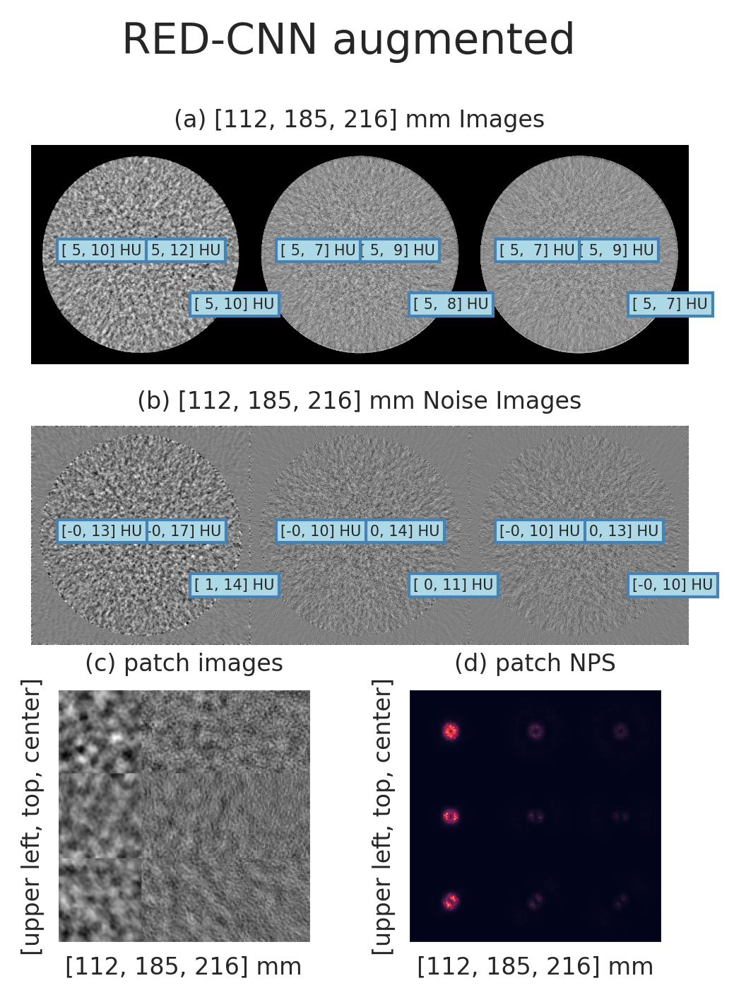

In [2]:
for kernel in ['fbp', 'RED-CNN', 'RED-CNN augmented']:
    characterize_noise_texture(datadir, results_dir=results_dir, patch_size=64, max_images=1000, kernel=kernel)

This is a great example of how we can use this tool to quickly tune our training routines and quantify how texture changes. You can imagine how we could use this to tune the training such that the noise texture is consistent across sizes by using different weighting schemes of the different noise texture sizes and see how that carries through to the final image

## Noise Power Spectra Plots

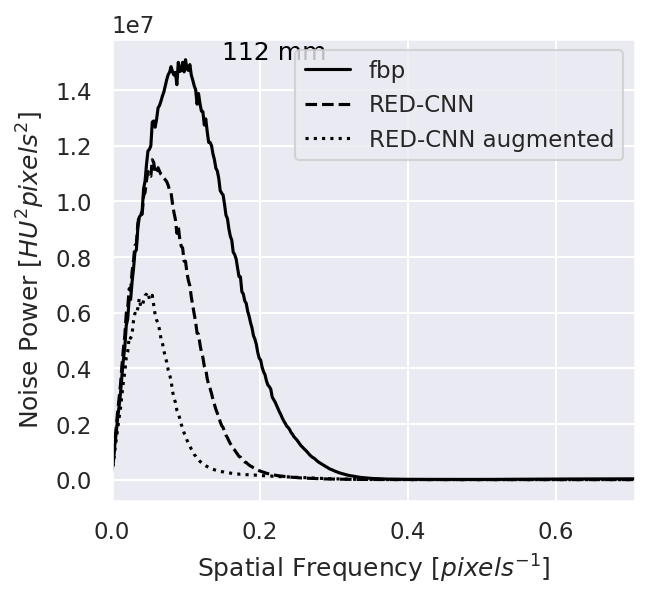

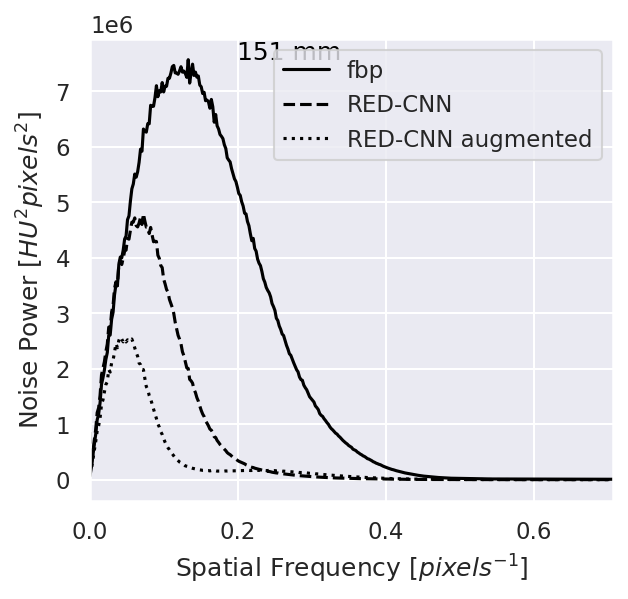

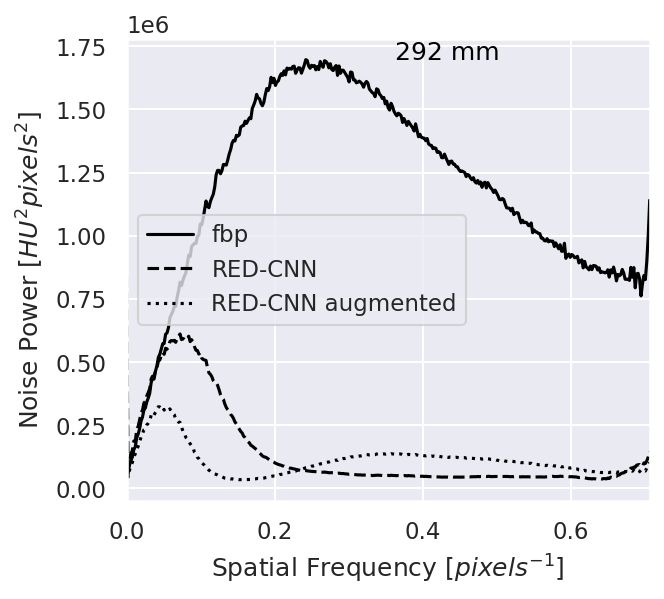

In [6]:
diameters = sorted(summary['diameter [mm]'].unique())
for d in diameters[::2]:
    if d == 200: continue
    plot_nps_profiles(results_dict, results_dir, diameters=[d], dpi=150)

PosixPath('../../results/02-26-2024_19-52_redcnn_remove_random_noise_level/nps.png')

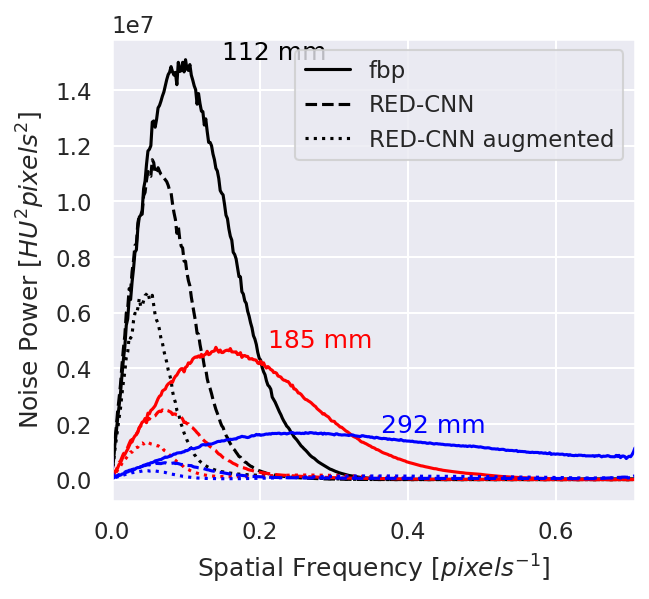

In [7]:
plot_nps_profiles(results_dict, results_dir, diameters=[112, 185, 292], dpi=150)

PosixPath('../../results/02-26-2024_19-52_redcnn_remove_random_noise_level/nps.png')

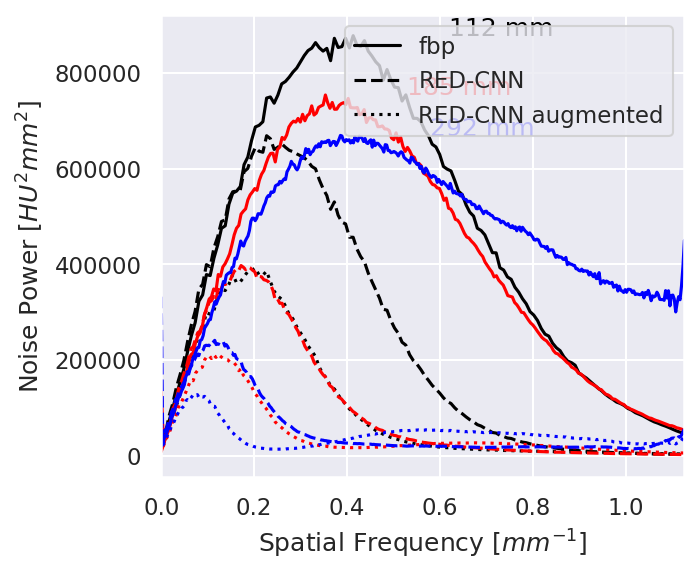

In [8]:
plot_nps_profiles(results_dict, results_dir, diameters=[112, 185, 292], dpi=150, units='mm')

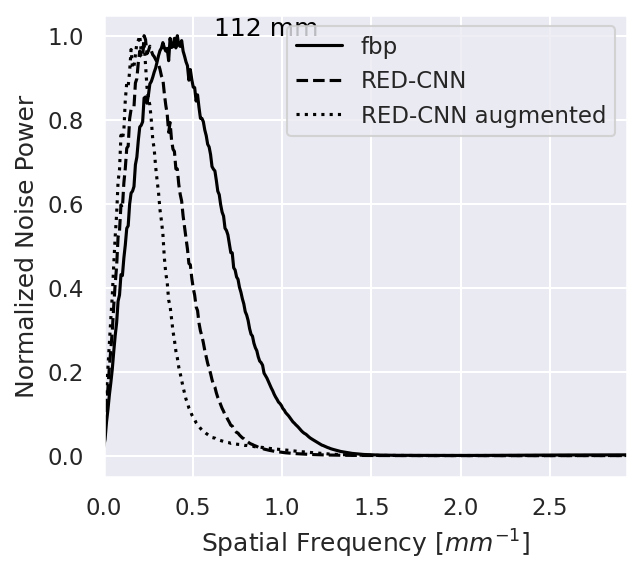

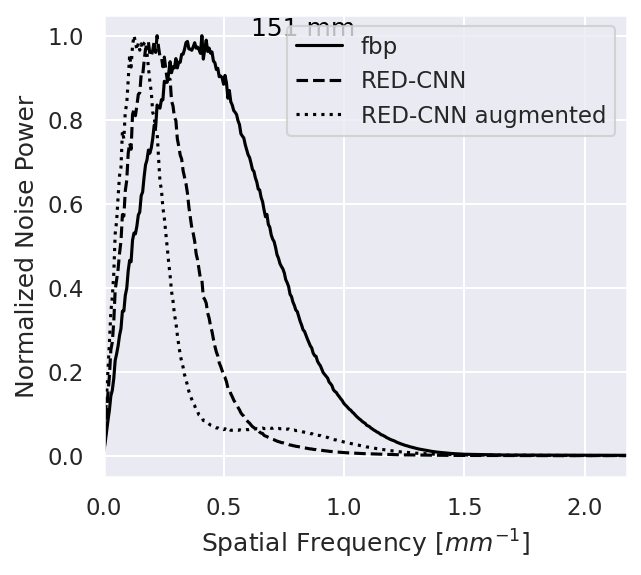

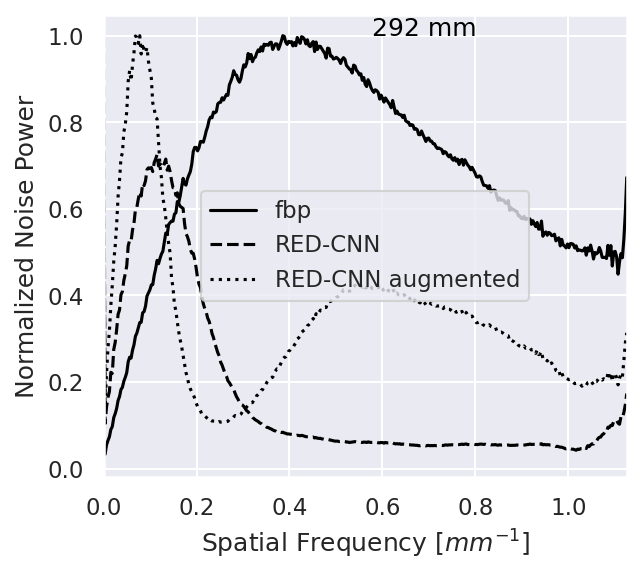

In [9]:
diameters = sorted(summary['diameter [mm]'].unique())
for d in diameters[::2]:
    if d == 200: continue
    plot_nps_profiles(results_dict, results_dir, diameters=[d], dpi=150, normalized=True, units='mm')